<a href="https://cognitiveclass.ai"><img src = "https://ibm.box.com/shared/static/9gegpsmnsoo25ikkbl4qzlvlyjbgxs5x.png" width = 400> </a>

<h1 align=center><font size = 5>Segmenting and Clustering Neighborhoods in Toronto City to Find a Suitable Location to Open a Pastry Shop</font></h1>


# Table of Contents

<ul>
    <li>Introduction</li>
    <li>Data Overview and Limitations</li>
    <li>Target Audience</li>
    <li>Methodology and Procedure</li>
    <li>Data Exploration and Analysis</li>
    <li>Recommendation</li>
</ul>

## Introduction

Ontario has the strongest economy in Canada, contributing the highest GDP per capita in the country. Toronto, its capital, has one of the top food scenes in Ontario. As aspiring pastry chefs based in Toronto, we want to open our first Pastry shop here. Which neighborhoods in Toronto can we consider?

Our Pastry shop concept focuses on products that go well with either coffee or tea. While there will be a small area reserved for diners, we are considering take-aways to drive most purchases. The product selection, for now, will focus on pastry products only. As we are entering this industry and market, we want to take the opportunity to position ourselves in neighborhoods with coffee shops and tea houses that serve products which complement our pastries so that we can more easily tap our market. This can also set the foundation to expand our reach later.

## Data Overview

The analysis uses data gathered from and limited to the following sources:
<ul>
    <li><b>Wikipedia</b> </li>
        <ul>
            <li>An existing Wikipedia page contains information on postal codes, boroughs, and neighborhoods in Toronto. We will use web scraping to utilize the data.</li>
            <li><a href = "https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M">https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M</a></li>
        </ul>
    <li><b>Geospatial Data</b> </li>
        <ul>
            <li>A csv file on the web contains the coordinates of each postal code in Toronto, as provided by the IBM Data Science Capstone project.</li>
        </ul>
        <ul>
        <li><a href = "https://cocl.us/Geospatial_data">https://cocl.us/Geospatial_data</a></li>
    </ul> 
    <li><b>Geopy library</b> </li>
        <ul>
            <li>Neighborhood coordinates are supplied through this library.</li>
        </ul>
    <li><b>FourSquare</b> </li>
        <ul>
            <li>This API grants access to data about establishments within a neighborhood. We utilize the data on the categories of establishments in each neighborhood.</li>
        </ul>
</ul>

## Target Audience

The information here may be of interest to the following groups of people, while being mindful of the context and data sources stated above:
<ol>
    <li>Entrepreneurs in search of a brief analysis involving the pastry shop industry in Toronto</li>
    <li>Data Science students and learners</li>
    <li>Junior Data Analysts or Junior Data Science Professionals</li>
</ol>

## Methodology and Procedure

With the data described above, this study uses K-Means Clustering to group similar neighborhoods into clusters to help identify potential locations to open our first pastry shop.

We carry out the following procedures:
<ol>
    <b><li>Data acquisition and staging</li></b>
        <ul>
            <li>Scrape data from Wikipedia. This contains data based on postal codes within Toronto.</li>
        </ul>
        <ul>
            <li>Obtain longitudes and latitudes for each postal code using geospatial data</li>
        </ul>
        <ul>
            <li>Refine the data from postal code level down to neighborhood level</li>
        </ul>
        <ul>
            <li>Obtain the coordinates per neighborhood</li>
        </ul>
        <ul>
            <li>Blend FourSquare data into each neighborhood to have a look into the types of establishments within each neighborhood</li>
        </ul>
    <b><li>Data transformation</li></b>
        <ul>
            <li>Perform one-hot encoding in preparation for clustering</li>
            <li>Calculate for the means for each establishment type in each neighborhood</li>
        </ul>
    <b><li>Cluster and examine</li></b>
        <ul>
            <li>Use the K Elbow Visualizer to identify the best k to use for clustering</li>
            <li>Perform K-Means Clustering</li>
            <li>Study each cluster with the aid of visualization and by examining the data points</li>
        </ul>
</ol>

Before we get the data and start exploring it, let's download all the dependencies that we will need.


In [16]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

# uncomment this line if you haven't completed the Foursquare API lab
#!conda install -c conda-forge geopy --yes 

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

# uncomment this line if you haven't completed the Foursquare API lab
#!conda install -c conda-forge folium=0.5.0 --yes 

import folium # map rendering library

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns

from time import sleep

print('Libraries imported.')

Libraries imported.


<a id='item1'></a>


### 1. Data acquisition and staging

In [17]:
# run the code below if the wikipedia package needs to be installed
#conda install -c conda-forge wikipedia

#### Scrape the postal code data for Toronto from Wikipedia

In [18]:
import wikipedia as wp

In [19]:
html = wp.page("List of postal codes of Canada: M").html().encode("UTF-8")
df = pd.read_html(html, header = 0)[0]
df.head()

,Postal Code,Borough,Neighbourhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


Remove codes without assigned Boroughs

In [20]:
df_PostalCodes = df[df['Borough']!="Not assigned"]
df_PostalCodes.reset_index(inplace=True, drop=True)
df_PostalCodes.head()

,Postal Code,Borough,Neighbourhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"


In [21]:
df_PostalCodes

,Postal Code,Borough,Neighbourhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"
5,M9A,Etobicoke,"Islington Avenue, Humber Valley Village"
6,M1B,Scarborough,"Malvern, Rouge"
7,M3B,North York,Don Mills
8,M4B,East York,"Parkview Hill, Woodbine Gardens"
9,M5B,Downtown Toronto,"Garden District, Ryerson"


For the analysis, we are including only those neighbourhoods with boroughs assigned to them. We note that within each borough there are multiple postal codes. Within each postal code, there are multiple neighbourhoods combined into one data row. We will have to transform the data later on such that each row contains one neighborhood.


In [22]:
df_PostalCodes.shape

(103, 3)

#### Obtain the coordinates of each postal code

In [23]:
df_Coordinates=pd.read_csv('http://cocl.us/Geospatial_data')
df_Coordinates

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476
5,M1J,43.744734,-79.239476
6,M1K,43.727929,-79.262029
7,M1L,43.711112,-79.284577
8,M1M,43.716316,-79.239476
9,M1N,43.692657,-79.264848


In [24]:
df_Canada = pd.merge(df_PostalCodes, df_Coordinates, on='Postal Code')
df_Canada

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494
5,M9A,Etobicoke,"Islington Avenue, Humber Valley Village",43.667856,-79.532242
6,M1B,Scarborough,"Malvern, Rouge",43.806686,-79.194353
7,M3B,North York,Don Mills,43.745906,-79.352188
8,M4B,East York,"Parkview Hill, Woodbine Gardens",43.706397,-79.309937
9,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937


In [25]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(df_Canada['Borough'].unique()),
        df_Canada.shape[0]
    )
)

The dataframe has 10 boroughs and 103 neighborhoods.


#### Refine the data from postal code level down to neighborhood level

As some postal codes contain multiple neighbourhoods, we need to assign each neighbourhood to its own row, then update coordinates for each neighborhood

In [26]:
df_Canada = df_Canada.assign(Neighbourhood=df_Canada['Neighbourhood'].str.split(', ')).explode('Neighbourhood')

In [27]:
df_Canada

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,Regent Park,43.654260,-79.360636
2,M5A,Downtown Toronto,Harbourfront,43.654260,-79.360636
3,M6A,North York,Lawrence Manor,43.718518,-79.464763
3,M6A,North York,Lawrence Heights,43.718518,-79.464763
4,M7A,Downtown Toronto,Queen's Park,43.662301,-79.389494
4,M7A,Downtown Toronto,Ontario Provincial Government,43.662301,-79.389494
5,M9A,Etobicoke,Islington Avenue,43.667856,-79.532242
5,M9A,Etobicoke,Humber Valley Village,43.667856,-79.532242


In [28]:
df_Canada["Address"] = df_Canada["Neighbourhood"] +  ", Toronto City, ON, Canada"
df_Canada

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Address
0,M3A,North York,Parkwoods,43.753259,-79.329656,"Parkwoods, Toronto City, ON, Canada"
1,M4A,North York,Victoria Village,43.725882,-79.315572,"Victoria Village, Toronto City, ON, Canada"
2,M5A,Downtown Toronto,Regent Park,43.654260,-79.360636,"Regent Park, Toronto City, ON, Canada"
2,M5A,Downtown Toronto,Harbourfront,43.654260,-79.360636,"Harbourfront, Toronto City, ON, Canada"
3,M6A,North York,Lawrence Manor,43.718518,-79.464763,"Lawrence Manor, Toronto City, ON, Canada"
3,M6A,North York,Lawrence Heights,43.718518,-79.464763,"Lawrence Heights, Toronto City, ON, Canada"
4,M7A,Downtown Toronto,Queen's Park,43.662301,-79.389494,"Queen's Park, Toronto City, ON, Canada"
4,M7A,Downtown Toronto,Ontario Provincial Government,43.662301,-79.389494,"Ontario Provincial Government, Toronto City, O..."
5,M9A,Etobicoke,Islington Avenue,43.667856,-79.532242,"Islington Avenue, Toronto City, ON, Canada"
5,M9A,Etobicoke,Humber Valley Village,43.667856,-79.532242,"Humber Valley Village, Toronto City, ON, Canada"


#### Use geopy library to update the coordintes of the neighbourhoods

In [29]:
geolocator = Nominatim(user_agent="toronto_explorer")

In [30]:
df_Canada["Coordinates"] = df_Canada["Address"].apply(geolocator.geocode)
df_Canada["Latitude"] = df_Canada["Coordinates"].apply(lambda x: x.latitude if x!= None else None)
df_Canada["Longitude"] = df_Canada["Coordinates"].apply(lambda x: x.longitude if x!= None else None)
df_Canada

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Address,Coordinates
0,M3A,North York,Parkwoods,43.761124,-79.324059,"Parkwoods, Toronto City, ON, Canada","(Parkwoods Village Drive, Parkway East, Don Va..."
1,M4A,North York,Victoria Village,43.732658,-79.311189,"Victoria Village, Toronto City, ON, Canada","(Victoria Village, Don Valley East, North York..."
2,M5A,Downtown Toronto,Regent Park,43.660706,-79.360457,"Regent Park, Toronto City, ON, Canada","(Regent Park, Toronto Centre, Old Toronto, Tor..."
2,M5A,Downtown Toronto,Harbourfront,43.640080,-79.380150,"Harbourfront, Toronto City, ON, Canada","(Harbourfront, Spadina—Fort York, Old Toronto,..."
3,M6A,North York,Lawrence Manor,43.722079,-79.437507,"Lawrence Manor, Toronto City, ON, Canada","(Lawrence Manor, Eglinton—Lawrence, North York..."
3,M6A,North York,Lawrence Heights,43.722778,-79.450933,"Lawrence Heights, Toronto City, ON, Canada","(Lawrence Heights, Eglinton—Lawrence, North Yo..."
4,M7A,Downtown Toronto,Queen's Park,43.659659,-79.390340,"Queen's Park, Toronto City, ON, Canada","(Queen's Park, University Avenue, Discovery Di..."
4,M7A,Downtown Toronto,Ontario Provincial Government,NaN,NaN,"Ontario Provincial Government, Toronto City, O...",None
5,M9A,Etobicoke,Islington Avenue,43.621482,-79.513685,"Islington Avenue, Toronto City, ON, Canada","(Islington Avenue, The Queensway, Etobicoke—La..."
5,M9A,Etobicoke,Humber Valley Village,43.666472,-79.524314,"Humber Valley Village, Toronto City, ON, Canada","(Humber Valley, Etobicoke Centre, Etobicoke, T..."


Remove data points that do not have any coordinates provided by Foursquare

In [31]:
df_Canada.dropna(inplace=True)
df_Canada.reset_index(inplace=True, drop=True)

In [32]:
df_Canada

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Address,Coordinates
0,M3A,North York,Parkwoods,43.761124,-79.324059,"Parkwoods, Toronto City, ON, Canada","(Parkwoods Village Drive, Parkway East, Don Va..."
1,M4A,North York,Victoria Village,43.732658,-79.311189,"Victoria Village, Toronto City, ON, Canada","(Victoria Village, Don Valley East, North York..."
2,M5A,Downtown Toronto,Regent Park,43.660706,-79.360457,"Regent Park, Toronto City, ON, Canada","(Regent Park, Toronto Centre, Old Toronto, Tor..."
3,M5A,Downtown Toronto,Harbourfront,43.640080,-79.380150,"Harbourfront, Toronto City, ON, Canada","(Harbourfront, Spadina—Fort York, Old Toronto,..."
4,M6A,North York,Lawrence Manor,43.722079,-79.437507,"Lawrence Manor, Toronto City, ON, Canada","(Lawrence Manor, Eglinton—Lawrence, North York..."
5,M6A,North York,Lawrence Heights,43.722778,-79.450933,"Lawrence Heights, Toronto City, ON, Canada","(Lawrence Heights, Eglinton—Lawrence, North Yo..."
6,M7A,Downtown Toronto,Queen's Park,43.659659,-79.390340,"Queen's Park, Toronto City, ON, Canada","(Queen's Park, University Avenue, Discovery Di..."
7,M9A,Etobicoke,Islington Avenue,43.621482,-79.513685,"Islington Avenue, Toronto City, ON, Canada","(Islington Avenue, The Queensway, Etobicoke—La..."
8,M9A,Etobicoke,Humber Valley Village,43.666472,-79.524314,"Humber Valley Village, Toronto City, ON, Canada","(Humber Valley, Etobicoke Centre, Etobicoke, T..."
9,M1B,Scarborough,Malvern,43.809196,-79.221701,"Malvern, Toronto City, ON, Canada","(Malvern, Scarborough—Rouge Park, Scarborough,..."


In [33]:
df_Canada.shape

(194, 7)

#### Blend FourSquare data into each neighborhood to have a look into the types of establishments within each neighborhood

Create a map of Toronto with neighborhoods superimposed on top.


In [34]:
address = 'Toronto, ON'
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


In [35]:
# create map of Toronto using latitude and longitude values
map_toronto = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(df_Canada['Latitude'], df_Canada['Longitude'], df_Canada['Borough'], df_Canada['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

Feel free to zoom into the above map, and click on each circle mark to reveal the name of the neighborhood and its respective borough.


Next, we are going to start utilizing the Foursquare API to explore the neighborhoods and segment them.


Define Foursquare Credentials and Version


In [36]:
CLIENT_ID = '2OWJPPWP1XA3YB2A01ZPZME0BWRQAP0HYRAKAZLBGKMGG0K2' # your Foursquare ID
CLIENT_SECRET = 'A5Y3P12OTUYLKTZ14HCPIAMYI1KXZEDXHPUKW5GSIYTBXOWX' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 2OWJPPWP1XA3YB2A01ZPZME0BWRQAP0HYRAKAZLBGKMGG0K2
CLIENT_SECRET:A5Y3P12OTUYLKTZ14HCPIAMYI1KXZEDXHPUKW5GSIYTBXOWX


Let's explore the first neighborhood in our dataframe.


Get the neighborhood's name.

In [37]:
df_Canada.loc[0, 'Neighbourhood']

'Parkwoods'

Get the neighborhood's latitude and longitude values.


In [38]:
neighborhood_latitude = df_Canada.loc[0, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = df_Canada.loc[0, 'Longitude'] # neighborhood longitude value
neighborhood_name = df_Canada.loc[0, 'Neighbourhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Parkwoods are 43.7611243, -79.3240594.


Now, let's get the top 100 venues that are in Parkwoods within a radius of 1 kilometer.


First, let's create the GET request URL.


In [39]:
LIMIT = 100 # limit of number of venues returned by Foursquare API

radius = 1000 # define radius

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=2OWJPPWP1XA3YB2A01ZPZME0BWRQAP0HYRAKAZLBGKMGG0K2&client_secret=A5Y3P12OTUYLKTZ14HCPIAMYI1KXZEDXHPUKW5GSIYTBXOWX&v=20180605&ll=43.7611243,-79.3240594&radius=1000&limit=100'

Send the GET request and examine the resutls


In [40]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '600f709464164847432d6b6b'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Parkwoods - Donalda',
  'headerFullLocation': 'Parkwoods - Donalda, Toronto',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 29,
  'suggestedBounds': {'ne': {'lat': 43.77012430900001,
    'lng': -79.31162124478192},
   'sw': {'lat': 43.75212429099999, 'lng': -79.33649755521807}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4b8991cbf964a520814232e3',
       'name': "Allwyn's Bakery",
       'location': {'address': '81 Underhill drive',
        'lat': 43.75984035203157,
        'lng': -79.32471879917513,
        'labeledLatLngs': [{'label': 'display',

We know that all the information is in the _items_ key. Before we proceed, let's define the **get_category_type** function


In [41]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Now we are ready to clean the json and structure it into a _pandas_ dataframe.


In [42]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

<ipython-input-42-561c05f0fdd1>:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues = json_normalize(venues) # flatten JSON


,name,categories,lat,lng
0,Allwyn's Bakery,Caribbean Restaurant,43.759840,-79.324719
1,Tim Hortons,Café,43.760668,-79.326368
2,LCBO,Liquor Store,43.757774,-79.314257
3,A&W,Fast Food Restaurant,43.760643,-79.326865
4,Shoppers Drug Mart,Pharmacy,43.760857,-79.324961


And how many venues were returned by Foursquare?


In [43]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

29 venues were returned by Foursquare.


<a id='item2'></a>


Let's create a function to repeat the same process to all the neighborhoods in Toronto


In [44]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        #results = requests.get(url).json()["response"]['groups'][0]['items']
        results = requests.get(url).json()['response'].get('groups',[{}])[0].get('items', [])
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Run the above function on each neighborhood and create a new dataframe called _toronto_venues_.

In [45]:
toronto_venues = getNearbyVenues(names=df_Canada['Neighbourhood'],
                                   latitudes=df_Canada['Latitude'],
                                   longitudes=df_Canada['Longitude']
                                  )

Parkwoods
Victoria Village
Regent Park
Harbourfront
Lawrence Manor
Lawrence Heights
Queen's Park
Islington Avenue
Humber Valley Village
Malvern
Rouge
Don Mills
Woodbine Gardens
Garden District
Ryerson
Glencairn
West Deane Park
Princess Gardens
Islington
Cloverdale
Rouge Hill
Port Union
Highland Creek
Don Mills
Woodbine Heights
St. James Town
Humewood-Cedarvale
Eringate
Bloordale Gardens
Old Burnhamthorpe
Guildwood
Morningside
West Hill
The Beaches
Berczy Park
Woburn
Leaside
Central Bay Street
Christie
Cedarbrae
Hillcrest Village
Bathurst Manor
Wilson Heights
Downsview North
Thorncliffe Park
Richmond
Adelaide
King
Dufferin
Dovercourt Village
Scarborough Village
Fairview
Henry Farm
Oriole
Northwood Park
York University
East Toronto
Broadview North (Old East York)
Harbourfront East
Union Station
Toronto Islands
Little Portugal
Trinity
Kennedy Park
Ionview
East Birchmount Park
Bayview Village
Downsview
The Danforth West
Riverdale
Toronto Dominion Centre
Design Exchange
Brockton
Parkdale Vi

In [46]:
print(toronto_venues.shape)
toronto_venues.head()

(5756, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.761124,-79.324059,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant
1,Parkwoods,43.761124,-79.324059,Tim Hortons,43.760668,-79.326368,Café
2,Parkwoods,43.761124,-79.324059,A&W,43.760643,-79.326865,Fast Food Restaurant
3,Parkwoods,43.761124,-79.324059,Shoppers Drug Mart,43.760857,-79.324961,Pharmacy
4,Parkwoods,43.761124,-79.324059,Food Basics,43.760549,-79.326045,Supermarket


Let's check how many venues were returned for each neighborhood


In [47]:
toronto_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Adelaide,100,100,100,100,100,100
Agincourt,12,12,12,12,12,12
Agincourt North,25,25,25,25,25,25
Alderwood,7,7,7,7,7,7
Bathurst Manor,68,68,68,68,68,68
Bathurst Quay,25,25,25,25,25,25
Bayview Village,15,15,15,15,15,15
Bedford Park,2,2,2,2,2,2
Berczy Park,100,100,100,100,100,100


Let's find out how many unique categories can be curated from all the returned venues


In [48]:
print('There are {} uniques categories.'.format(len(toronto_venues['Venue Category'].unique())))

There are 322 uniques categories.


In [49]:
toronto_venues

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.761124,-79.324059,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant
1,Parkwoods,43.761124,-79.324059,Tim Hortons,43.760668,-79.326368,Café
2,Parkwoods,43.761124,-79.324059,A&W,43.760643,-79.326865,Fast Food Restaurant
3,Parkwoods,43.761124,-79.324059,Shoppers Drug Mart,43.760857,-79.324961,Pharmacy
4,Parkwoods,43.761124,-79.324059,Food Basics,43.760549,-79.326045,Supermarket
5,Parkwoods,43.761124,-79.324059,Pizza Pizza,43.760231,-79.325666,Pizza Place
6,Parkwoods,43.761124,-79.324059,Parkwoods Coin Laundry,43.760386,-79.324894,Laundry Service
7,Parkwoods,43.761124,-79.324059,Dollarama,43.760341,-79.325519,Discount Store
8,Parkwoods,43.761124,-79.324059,La Notre,43.760704,-79.325396,Coffee Shop
9,Parkwoods,43.761124,-79.324059,Family Food Fair,43.760422,-79.325012,ATM


<a id='item3'></a>


### 2. Data transformation

#### Perform one-hot encoding


In [50]:
# one hot encoding
toronto_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighborhood'] = toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]

toronto_onehot.head()

,Yoga Studio,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Service,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arepa Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cable Car,Café,Cajun / Creole Restaurant,Cantonese Restaurant,Caribbean Restaurant,Castle,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Cafeteria,College Gym,College Rec Center,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Creperie,Cuban Restaurant,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Ethiopian Restaurant,Event Space,Factory,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hakka Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hong Kong Restaurant,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Leather Goods Store,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Luggage Store,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Movie Theater,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Night Market,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Supply Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Peking Duck Restaurant,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Pie Shop,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Poutine Place,Print Shop,Pub,Racetrack,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,River,Road,Rock Climbing Spot,Rock Club,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Store,Shopping Mall,Shopping Plaza,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,South American Restaurant,Souvlaki Shop,Spa,Span

And let's examine the new dataframe size.


In [51]:
toronto_onehot.shape

(5756, 322)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category


In [52]:
toronto_grouped = toronto_onehot.groupby('Neighborhood').mean().reset_index()
toronto_grouped

,Neighborhood,Yoga Studio,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Service,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arepa Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cable Car,Café,Cajun / Creole Restaurant,Cantonese Restaurant,Caribbean Restaurant,Castle,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Cafeteria,College Gym,College Rec Center,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Creperie,Cuban Restaurant,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Ethiopian Restaurant,Event Space,Factory,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hakka Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hong Kong Restaurant,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Leather Goods Store,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Luggage Store,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Movie Theater,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Night Market,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Supply Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Peking Duck Restaurant,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Pie Shop,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Poutine Place,Print Shop,Pub,Racetrack,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,River,Road,Rock Climbing Spot,Rock Club,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Store,Shopping Mall,Shopping Plaza,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,South American Restaurant,Souvlaki Shop,Spa,Span

Let's confirm the new size


In [53]:
toronto_grouped.shape

(184, 322)

Retain only the industries or establishments relevant to our analysis, including complementary establishments like coffee shops & tea rooms, as well as competing alternatives.

In [54]:
toronto_grouped_pastry = toronto_grouped[['Neighborhood','Bakery','Café','Coffee Shop','Donut Shop','Pastry Shop','Tea Room']]
toronto_grouped_pastry

,Neighborhood,Bakery,Café,Coffee Shop,Donut Shop,Pastry Shop,Tea Room
0,Adelaide,0.020000,0.060000,0.060000,0.000000,0.000000,0.010000
1,Agincourt,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000
2,Agincourt North,0.040000,0.000000,0.040000,0.000000,0.000000,0.000000
3,Alderwood,0.000000,0.000000,0.142857,0.000000,0.000000,0.000000
4,Bathurst Manor,0.029412,0.029412,0.044118,0.000000,0.014706,0.000000
5,Bathurst Quay,0.000000,0.120000,0.160000,0.000000,0.000000,0.000000
6,Bayview Village,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,Bedford Park,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,Berczy Park,0.030000,0.050000,0.080000,0.000000,0.000000,0.000000
9,Birch Cliff,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000


Let's write a function to sort the venues in descending order.


In [55]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top venues for each neighborhood. We look for the top 6 venues as this is the number of categories relevant to our analysis.


In [56]:
num_top_venues = 6

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = toronto_grouped_pastry['Neighborhood']

for ind in np.arange(toronto_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(toronto_grouped_pastry.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue
0,Adelaide,Coffee Shop,Café,Bakery,Tea Room,Pastry Shop,Donut Shop
1,Agincourt,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery
2,Agincourt North,Coffee Shop,Bakery,Tea Room,Pastry Shop,Donut Shop,Café
3,Alderwood,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery
4,Bathurst Manor,Coffee Shop,Café,Bakery,Pastry Shop,Tea Room,Donut Shop


<a id='item4'></a>


## 3. Cluster and examine

#### Using the K Elbow Visualizer, find the best k to use for clustering

In [57]:
import matplotlib.pyplot as plt
#!conda install -c districtdatalabs yellowbrick
from yellowbrick.cluster import KElbowVisualizer

Find the best K to use

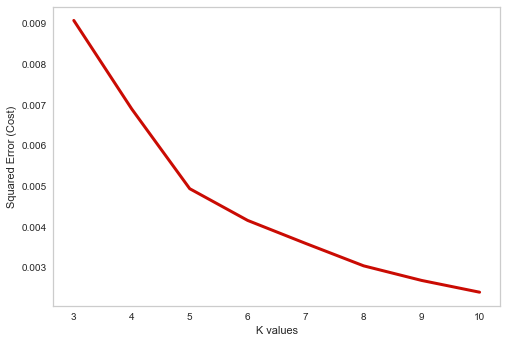

In [58]:
toronto_grouped_clustering = toronto_grouped_pastry.drop('Neighborhood', 1)
error_cost = []

# run k-means clustering
for i in range(3,11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    try:
        kmeans.fit(toronto_grouped_clustering)
    except ValueError:
        print("error on line ", i)
        
    #calculate squared error for the clustered points
    error_cost.append(kmeans.inertia_/100)

# plot the K values against the squared error cost
plt.plot(range(3,11), error_cost, color='r', linewidth='3')
plt.xlabel('K values')
plt.ylabel('Squared Error (Cost)')
plt.grid(color='white', linestyle='-', linewidth=2)
plt.show()

Use the K Elbow Visualizer to further aid in choosing the value of k

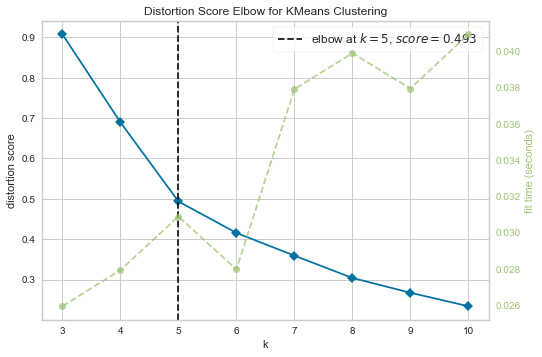

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [59]:
model = KMeans()
visualizer = KElbowVisualizer(model,k=(3,11))
visualizer.fit(toronto_grouped_clustering)
visualizer.show()

Use K = 5

#### Perform K-Means Clustering on the neighborhoods

In [60]:
toronto_grouped_clustering
kclusters = 5

# run k-means clustering
torkmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
torkmeans.labels_[0:10] 

array([0, 0, 1, 3, 0, 3, 1, 1, 0, 4])

In [61]:
torkmeans.labels_

array([0, 0, 1, 3, 0, 3, 1, 1, 0, 4, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 1, 1,
       1, 3, 3, 0, 0, 0, 0, 0, 3, 0, 0, 4, 0, 0, 0, 1, 3, 0, 1, 0, 3, 0,
       1, 1, 1, 0, 2, 1, 0, 1, 0, 3, 3, 3, 1, 1, 1, 0, 1, 2, 2, 1, 1, 1,
       0, 0, 3, 1, 0, 0, 0, 1, 1, 0, 3, 3, 0, 1, 1, 0, 1, 0, 0, 1, 2, 3,
       0, 1, 2, 2, 2, 3, 1, 3, 3, 0, 1, 3, 0, 0, 1, 1, 1, 1, 1, 3, 1, 1,
       0, 1, 0, 3, 0, 3, 0, 1, 0, 0, 1, 3, 1, 1, 0, 0, 0, 0, 0, 3, 3, 1,
       1, 0, 0, 1, 0, 3, 1, 1, 3, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0,
       3, 0, 0, 0, 0, 4, 0, 1, 3, 4, 1, 3, 1, 1, 0, 1, 0, 0, 1, 3, 3, 3,
       1, 0, 2, 1, 3, 3, 3, 0])

In [62]:
neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue
0,Adelaide,Coffee Shop,Café,Bakery,Tea Room,Pastry Shop,Donut Shop
1,Agincourt,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery
2,Agincourt North,Coffee Shop,Bakery,Tea Room,Pastry Shop,Donut Shop,Café
3,Alderwood,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery
4,Bathurst Manor,Coffee Shop,Café,Bakery,Pastry Shop,Tea Room,Donut Shop
5,Bathurst Quay,Coffee Shop,Café,Tea Room,Pastry Shop,Donut Shop,Bakery
6,Bayview Village,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery
7,Bedford Park,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery
8,Berczy Park,Coffee Shop,Café,Bakery,Tea Room,Pastry Shop,Donut Shop
9,Birch Cliff,Café,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Bakery


In [63]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', torkmeans.labels_)

In [64]:
neighborhoods_venues_sorted

,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue
0,0,Adelaide,Coffee Shop,Café,Bakery,Tea Room,Pastry Shop,Donut Shop
1,0,Agincourt,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery
2,1,Agincourt North,Coffee Shop,Bakery,Tea Room,Pastry Shop,Donut Shop,Café
3,3,Alderwood,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery
4,0,Bathurst Manor,Coffee Shop,Café,Bakery,Pastry Shop,Tea Room,Donut Shop
5,3,Bathurst Quay,Coffee Shop,Café,Tea Room,Pastry Shop,Donut Shop,Bakery
6,1,Bayview Village,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery
7,1,Bedford Park,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery
8,0,Berczy Park,Coffee Shop,Café,Bakery,Tea Room,Pastry Shop,Donut Shop
9,4,Birch Cliff,Café,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Bakery


In [65]:
df_Canada

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Address,Coordinates
0,M3A,North York,Parkwoods,43.761124,-79.324059,"Parkwoods, Toronto City, ON, Canada","(Parkwoods Village Drive, Parkway East, Don Va..."
1,M4A,North York,Victoria Village,43.732658,-79.311189,"Victoria Village, Toronto City, ON, Canada","(Victoria Village, Don Valley East, North York..."
2,M5A,Downtown Toronto,Regent Park,43.660706,-79.360457,"Regent Park, Toronto City, ON, Canada","(Regent Park, Toronto Centre, Old Toronto, Tor..."
3,M5A,Downtown Toronto,Harbourfront,43.640080,-79.380150,"Harbourfront, Toronto City, ON, Canada","(Harbourfront, Spadina—Fort York, Old Toronto,..."
4,M6A,North York,Lawrence Manor,43.722079,-79.437507,"Lawrence Manor, Toronto City, ON, Canada","(Lawrence Manor, Eglinton—Lawrence, North York..."
5,M6A,North York,Lawrence Heights,43.722778,-79.450933,"Lawrence Heights, Toronto City, ON, Canada","(Lawrence Heights, Eglinton—Lawrence, North Yo..."
6,M7A,Downtown Toronto,Queen's Park,43.659659,-79.390340,"Queen's Park, Toronto City, ON, Canada","(Queen's Park, University Avenue, Discovery Di..."
7,M9A,Etobicoke,Islington Avenue,43.621482,-79.513685,"Islington Avenue, Toronto City, ON, Canada","(Islington Avenue, The Queensway, Etobicoke—La..."
8,M9A,Etobicoke,Humber Valley Village,43.666472,-79.524314,"Humber Valley Village, Toronto City, ON, Canada","(Humber Valley, Etobicoke Centre, Etobicoke, T..."
9,M1B,Scarborough,Malvern,43.809196,-79.221701,"Malvern, Toronto City, ON, Canada","(Malvern, Scarborough—Rouge Park, Scarborough,..."


Let's create a new dataframe that includes the cluster as well as the top venues for each neighborhood.

In [66]:
toronto_merged = df_Canada

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
toronto_merged = toronto_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighbourhood')

toronto_merged = toronto_merged[~toronto_merged['Cluster Labels'].isnull()]
toronto_merged['Cluster Labels'] = toronto_merged['Cluster Labels'].astype(int)
toronto_merged

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Address,Coordinates,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue
0,M3A,North York,Parkwoods,43.761124,-79.324059,"Parkwoods, Toronto City, ON, Canada","(Parkwoods Village Drive, Parkway East, Don Va...",0,Coffee Shop,Café,Tea Room,Pastry Shop,Donut Shop,Bakery
1,M4A,North York,Victoria Village,43.732658,-79.311189,"Victoria Village, Toronto City, ON, Canada","(Victoria Village, Don Valley East, North York...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery
2,M5A,Downtown Toronto,Regent Park,43.660706,-79.360457,"Regent Park, Toronto City, ON, Canada","(Regent Park, Toronto Centre, Old Toronto, Tor...",3,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery
3,M5A,Downtown Toronto,Harbourfront,43.640080,-79.380150,"Harbourfront, Toronto City, ON, Canada","(Harbourfront, Spadina—Fort York, Old Toronto,...",3,Coffee Shop,Café,Tea Room,Bakery,Pastry Shop,Donut Shop
4,M6A,North York,Lawrence Manor,43.722079,-79.437507,"Lawrence Manor, Toronto City, ON, Canada","(Lawrence Manor, Eglinton—Lawrence, North York...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery
5,M6A,North York,Lawrence Heights,43.722778,-79.450933,"Lawrence Heights, Toronto City, ON, Canada","(Lawrence Heights, Eglinton—Lawrence, North Yo...",0,Coffee Shop,Bakery,Tea Room,Café,Pastry Shop,Donut Shop
6,M7A,Downtown Toronto,Queen's Park,43.659659,-79.390340,"Queen's Park, Toronto City, ON, Canada","(Queen's Park, University Avenue, Discovery Di...",3,Coffee Shop,Café,Donut Shop,Tea Room,Pastry Shop,Bakery
7,M9A,Etobicoke,Islington Avenue,43.621482,-79.513685,"Islington Avenue, Toronto City, ON, Canada","(Islington Avenue, The Queensway, Etobicoke—La...",0,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery
8,M9A,Etobicoke,Humber Valley Village,43.666472,-79.524314,"Humber Valley Village, Toronto City, ON, Canada","(Humber Valley, Etobicoke Centre, Etobicoke, T...",2,Bakery,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café
9,M1B,Scarborough,Malvern,43.809196,-79.221701,"Malvern, Toronto City, ON, Canada","(Malvern, Scarborough—Rouge Park, Scarborough,...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery


Also include mean scores for each type of establishment

In [67]:
toronto_merged_scores = toronto_merged.join(toronto_grouped_pastry.set_index('Neighborhood'), on='Neighbourhood')

Finally, let's visualize the resulting clusters


In [68]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

print(rainbow)

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(toronto_merged['Latitude'], toronto_merged['Longitude'], toronto_merged['Neighbourhood'], toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    #print(cluster)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

['#8000ff', '#00b5eb', '#80ffb4', '#ffb360', '#ff0000']


<a id='item5'></a>


In [69]:
toronto_merged.shape

(193, 14)

#### Study each cluster with the aid of visualization and by examining the data points

Examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, we can then assign a name to each cluster.


A quick look at the clusters suggests that we may want to focus efforts on Clusters 2 (Coffee Shops) & 3 (Cafes), which have a higher concentration of Coffee Shops and Cafes. Further, Cluster 1 has more bakeries that will compete with our store.

A closer inspection of Cluster 2 below, together with the respective neighborhood scores in section 3 above, suggests that the neighborhoods of Oriole, Queen's Park, Roselawn, and St. James Town are of most interest as they have the most coffee shops & cafes while having a low or no presence for bakeries and donut shops.

To close off the analysis, while the four neighborhoods above provide a starting point, due diligence is needed on the part of the cautious entrepreneur to inspect these neighborhoods further, and if necessary, expand the analysis to include more neighborhoods from Cluster 2, or Cluster 3, and supplementary data from other sources.

#### Cluster 0 - Lower density Coffee Shops and Cafes


In [70]:
toronto_merged_scores[toronto_merged_scores['Cluster Labels'] == 0]

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Address,Coordinates,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,Bakery,Café,Coffee Shop,Donut Shop,Pastry Shop,Tea Room
0,M3A,North York,Parkwoods,43.761124,-79.324059,"Parkwoods, Toronto City, ON, Canada","(Parkwoods Village Drive, Parkway East, Don Va...",0,Coffee Shop,Café,Tea Room,Pastry Shop,Donut Shop,Bakery,0.000000,0.083333,0.083333,0.000000,0.000000,0.000000
5,M6A,North York,Lawrence Heights,43.722778,-79.450933,"Lawrence Heights, Toronto City, ON, Canada","(Lawrence Heights, Eglinton—Lawrence, North Yo...",0,Coffee Shop,Bakery,Tea Room,Café,Pastry Shop,Donut Shop,0.021277,0.010638,0.053191,0.000000,0.000000,0.010638
7,M9A,Etobicoke,Islington Avenue,43.621482,-79.513685,"Islington Avenue, Toronto City, ON, Canada","(Islington Avenue, The Queensway, Etobicoke—La...",0,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery,0.000000,0.000000,0.068966,0.000000,0.000000,0.000000
11,M3B,North York,Don Mills,43.775347,-79.345944,"Don Mills, Toronto City, ON, Canada","(Don Mills, Sheppard Avenue East, Parkway Fore...",0,Coffee Shop,Bakery,Tea Room,Pastry Shop,Donut Shop,Café,0.015385,0.000000,0.076923,0.000000,0.000000,0.000000
13,M5B,Downtown Toronto,Garden District,43.656500,-79.377114,"Garden District, Toronto City, ON, Canada","(Garden District, Toronto Centre, Old Toronto,...",0,Coffee Shop,Café,Tea Room,Bakery,Pastry Shop,Donut Shop,0.015873,0.031746,0.079365,0.000000,0.000000,0.015873
14,M5B,Downtown Toronto,Ryerson,43.658469,-79.378993,"Ryerson, Toronto City, ON, Canada","(Ryerson University, Dalhousie Street, Garden ...",0,Coffee Shop,Café,Tea Room,Bakery,Pastry Shop,Donut Shop,0.010000,0.030000,0.120000,0.000000,0.000000,0.020000
17,M9B,Etobicoke,Princess Gardens,43.640466,-79.391224,"Princess Gardens, Toronto City, ON, Canada","(The Princess, Navy Wharf Court, CityPlace, Sp...",0,Coffee Shop,Café,Tea Room,Pastry Shop,Donut Shop,Bakery,0.000000,0.024691,0.098765,0.000000,0.000000,0.000000
18,M9B,Etobicoke,Islington,43.645335,-79.524816,"Islington, Toronto City, ON, Canada","(Islington, 1240, Islington Avenue, Islington ...",0,Coffee Shop,Bakery,Tea Room,Pastry Shop,Donut Shop,Café,0.037037,0.000000,0.111111,0.000000,0.000000,0.000000
19,M9B,Etobicoke,Cloverdale,43.633637,-79.549745,"Cloverdale, Toronto City, ON, Canada","(Cloverdale, Etobicoke—Lakeshore, Etobicoke, T...",0,Coffee Shop,Café,Tea Room,Pastry Shop,Donut Shop,Bakery,0.000000,0.037037,0.074074,0.000000,0.000000,0.000000
23,M3C,North York,Don Mills,43.775347,-79.345944,"Don Mills, Toronto City, ON, Canada","(Don Mills, Sheppard Avenue East, Parkway Fore...",0,Coffee Shop,Bakery,Tea Room,Pastry Shop,Donut Shop,Café,0.015385,0.000000,0.076923,0.000000,0.000000,0.000000


#### Cluster 1 - Sparsely served neighborhoods


In [71]:
toronto_merged_scores[toronto_merged_scores['Cluster Labels'] == 1]

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Address,Coordinates,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,Bakery,Café,Coffee Shop,Donut Shop,Pastry Shop,Tea Room
1,M4A,North York,Victoria Village,43.732658,-79.311189,"Victoria Village, Toronto City, ON, Canada","(Victoria Village, Don Valley East, North York...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,M6A,North York,Lawrence Manor,43.722079,-79.437507,"Lawrence Manor, Toronto City, ON, Canada","(Lawrence Manor, Eglinton—Lawrence, North York...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,M1B,Scarborough,Malvern,43.809196,-79.221701,"Malvern, Toronto City, ON, Canada","(Malvern, Scarborough—Rouge Park, Scarborough,...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10,M1B,Scarborough,Rouge,43.804930,-79.165837,"Rouge, Toronto City, ON, Canada","(Rouge, Scarborough—Rouge Park, Scarborough, T...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
20,M1C,Scarborough,Rouge Hill,43.780271,-79.130499,"Rouge Hill, Toronto City, ON, Canada","(Rouge Hill, 6251, Lawrence Avenue East, West ...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
21,M1C,Scarborough,Port Union,43.775504,-79.134976,"Port Union, Toronto City, ON, Canada","(Port Union, Scarborough—Rouge Park, Scarborou...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
22,M1C,Scarborough,Highland Creek,43.790117,-79.173334,"Highland Creek, Toronto City, ON, Canada","(Highland Creek, Scarborough—Rouge Park, Scarb...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
24,M4C,East York,Woodbine Heights,43.699920,-79.319279,"Woodbine Heights, Toronto City, ON, Canada","(Woodbine Heights, Beaches—East York, East Yor...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
26,M6C,York,Humewood-Cedarvale,43.688322,-79.428080,"Humewood-Cedarvale, Toronto City, ON, Canada","(Humewood Drive, Humewood, Toronto—St. Paul's,...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
27,M9C,Etobicoke,Eringate,43.662273,-79.576516,"Eringate, Toronto City, ON, Canada","(Eringate, Etobicoke Centre, Etobicoke, Toront...",1,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,Bakery,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


#### Cluster 2 - Bakery towns

In [72]:
toronto_merged_scores[toronto_merged_scores['Cluster Labels'] == 2]

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Address,Coordinates,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,Bakery,Café,Coffee Shop,Donut Shop,Pastry Shop,Tea Room
8,M9A,Etobicoke,Humber Valley Village,43.666472,-79.524314,"Humber Valley Village, Toronto City, ON, Canada","(Humber Valley, Etobicoke Centre, Etobicoke, T...",2,Bakery,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,0.20,0.0,0.00,0.0,0.0,0.0
12,M4B,East York,Woodbine Gardens,43.712078,-79.302567,"Woodbine Gardens, Toronto City, ON, Canada","(Woodbine Gardens, Beaches—East York, East Yor...",2,Coffee Shop,Bakery,Tea Room,Pastry Shop,Donut Shop,Café,0.25,0.0,0.25,0.0,0.0,0.0
15,M6B,North York,Glencairn,43.708712,-79.440685,"Glencairn, Toronto City, ON, Canada","(Glencairn, Allen Road, Glen Park, Eglinton—La...",2,Bakery,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,0.20,0.0,0.00,0.0,0.0,0.0
85,M6L,North York,Maple Leaf Park,43.715824,-79.493416,"Maple Leaf Park, Toronto City, ON, Canada","(Maple Leaf Park, York South—Weston, North Yor...",2,Bakery,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,0.25,0.0,0.00,0.0,0.0,0.0
87,M9L,North York,Humber Summit,43.760078,-79.571760,"Humber Summit, Toronto City, ON, Canada","(Humber Summit, Humber River—Black Creek, Nort...",2,Bakery,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,0.40,0.0,0.00,0.0,0.0,0.0
163,M8V,Etobicoke,Mimico South,43.616677,-79.496805,"Mimico South, Toronto City, ON, Canada","(Mimico, Windsor Street, Mimico Village, Etobi...",2,Bakery,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,0.25,0.0,0.00,0.0,0.0,0.0
187,M8Y,Etobicoke,Mimico NE,43.616677,-79.496805,"Mimico NE, Toronto City, ON, Canada","(Mimico, Windsor Street, Mimico Village, Etobi...",2,Bakery,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,0.25,0.0,0.00,0.0,0.0,0.0
190,M8Z,Etobicoke,Mimico NW,43.616677,-79.496805,"Mimico NW, Toronto City, ON, Canada","(Mimico, Windsor Street, Mimico Village, Etobi...",2,Bakery,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Café,0.25,0.0,0.00,0.0,0.0,0.0


#### Cluster 3 - Coffee shop havens


In [73]:
toronto_merged_scores[toronto_merged_scores['Cluster Labels'] == 3]

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Address,Coordinates,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,Bakery,Café,Coffee Shop,Donut Shop,Pastry Shop,Tea Room
2,M5A,Downtown Toronto,Regent Park,43.660706,-79.360457,"Regent Park, Toronto City, ON, Canada","(Regent Park, Toronto Centre, Old Toronto, Tor...",3,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery,0.000000,0.000000,0.136364,0.000000,0.0,0.000000
3,M5A,Downtown Toronto,Harbourfront,43.640080,-79.380150,"Harbourfront, Toronto City, ON, Canada","(Harbourfront, Spadina—Fort York, Old Toronto,...",3,Coffee Shop,Café,Tea Room,Bakery,Pastry Shop,Donut Shop,0.010000,0.050000,0.150000,0.000000,0.0,0.010000
6,M7A,Downtown Toronto,Queen's Park,43.659659,-79.390340,"Queen's Park, Toronto City, ON, Canada","(Queen's Park, University Avenue, Discovery Di...",3,Coffee Shop,Café,Donut Shop,Tea Room,Pastry Shop,Bakery,0.000000,0.092105,0.250000,0.013158,0.0,0.000000
31,M1E,Scarborough,Morningside,43.782601,-79.204958,"Morningside, Toronto City, ON, Canada","(Morningside, Scarborough—Guildwood, Scarborou...",3,Coffee Shop,Café,Tea Room,Pastry Shop,Donut Shop,Bakery,0.000000,0.083333,0.166667,0.000000,0.0,0.000000
37,M5G,Downtown Toronto,Central Bay Street,43.655644,-79.383701,"Central Bay Street, Toronto City, ON, Canada","(Bay Street, Little Tokyo, Toronto Centre, Old...",3,Coffee Shop,Café,Tea Room,Pastry Shop,Donut Shop,Bakery,0.000000,0.013699,0.136986,0.000000,0.0,0.000000
50,M1J,Scarborough,Scarborough Village,43.743742,-79.211632,"Scarborough Village, Toronto City, ON, Canada","(Scarborough Village, Scarborough—Guildwood, S...",3,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery,0.000000,0.000000,0.222222,0.000000,0.0,0.000000
51,M2J,North York,Fairview,43.643430,-79.379059,"Fairview, Toronto City, ON, Canada","(Scotiabank Arena, 40, Bay Street, South Core,...",3,Coffee Shop,Café,Bakery,Tea Room,Pastry Shop,Donut Shop,0.020408,0.020408,0.183673,0.000000,0.0,0.010204
53,M2J,North York,Oriole,43.765498,-79.364269,"Oriole, Toronto City, ON, Canada","(Oriole, Highway 401 Collectors, Silver Hills,...",3,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery,0.000000,0.000000,0.428571,0.000000,0.0,0.000000
55,M3J,North York,York University,43.774332,-79.500271,"York University, Toronto City, ON, Canada","(York University, 120, Ian Macdonald Boulevard...",3,Coffee Shop,Café,Tea Room,Pastry Shop,Donut Shop,Bakery,0.000000,0.142857,0.190476,0.000000,0.0,0.000000
56,M4J,East York,East Toronto,43.721789,-79.374027,"East Toronto, Toronto City, ON, Canada","(E Wing, Life Saving Drive, Don Valley West, N...",3,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Café,Bakery,0.000000,0.000000,0.250000,0.000000,0.0,0.000000


#### Cluster 4 - Cafe neighborhoods

In [74]:
toronto_merged_scores[toronto_merged_scores['Cluster Labels'] == 4]

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Address,Coordinates,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,Bakery,Café,Coffee Shop,Donut Shop,Pastry Shop,Tea Room
49,M6H,West Toronto,Dovercourt Village,43.665307,-79.432636,"Dovercourt Village, Toronto City, ON, Canada","(Dovercourt, Davenport, Old Toronto, Toronto, ...",4,Café,Coffee Shop,Tea Room,Pastry Shop,Donut Shop,Bakery,0.000000,0.333333,0.111111,0.0,0.0,0.0
60,M5J,Downtown Toronto,Toronto Islands,43.623054,-79.394316,"Toronto Islands, Toronto City, ON, Canada","(Toronto Islands, Old Toronto, Toronto, Golden...",4,Café,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Bakery,0.000000,0.250000,0.000000,0.0,0.0,0.0
100,M1N,Scarborough,Birch Cliff,43.691805,-79.264494,"Birch Cliff, Toronto City, ON, Canada","(The Birch Cliff, Kingston Road, Birchcliff, S...",4,Café,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,Bakery,0.000000,0.250000,0.000000,0.0,0.0,0.0
136,M5S,Downtown Toronto,University of Toronto,43.663462,-79.397760,"University of Toronto, Toronto City, ON, Canada","(University of Toronto, Harbord Street, Harbor...",4,Café,Bakery,Tea Room,Pastry Shop,Donut Shop,Coffee Shop,0.034483,0.206897,0.000000,0.0,0.0,0.0


#### Visualizations for further analysis

<ipython-input-162-23d234b28eff>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  by_cafe.set_yticklabels(by_cafe.get_ymajorticklabels(), fontsize = 13)


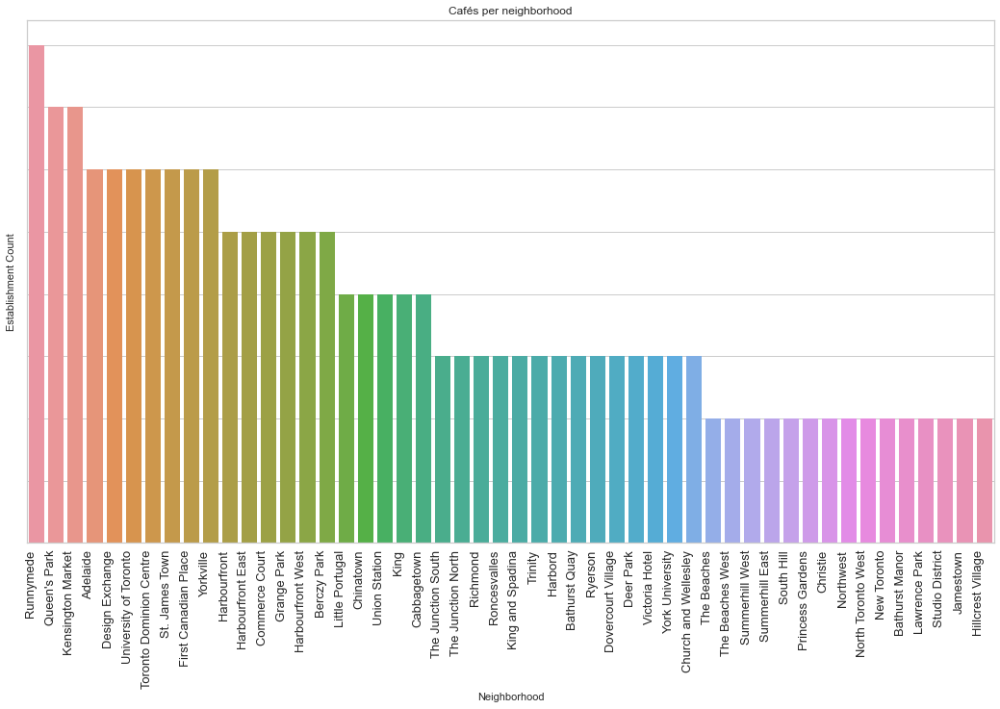

<Figure size 1440x864 with 0 Axes>

In [162]:
df_cafe = toronto_venues[toronto_venues['Venue Category'] == 'Café'].groupby('Neighborhood').count().sort_values('Venue Category', ascending = False)
#df_cafe
df_cafe_bar = df_cafe.head(50)
plt.figure(figsize=(18,10))
by_cafe = sns.barplot(x=df_cafe_bar.index,y='Venue Category', data = df_cafe_bar)
by_cafe.set_xticklabels(by_cafe.get_xticklabels(), 
                          rotation=90, 
                          horizontalalignment='right',
                           fontsize = 13)
by_cafe.set(ylabel = "Establishment Count")
by_cafe.set_yticklabels(by_cafe.get_ymajorticklabels(), fontsize = 13)
by_cafe.set_title("Cafés per neighborhood")
plt.figure(figsize=(20,12))
plt.show()

<ipython-input-139-c6ec348bf789>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  by_coffee.set_yticklabels(by_cafe.get_ymajorticklabels(), fontsize = 13)


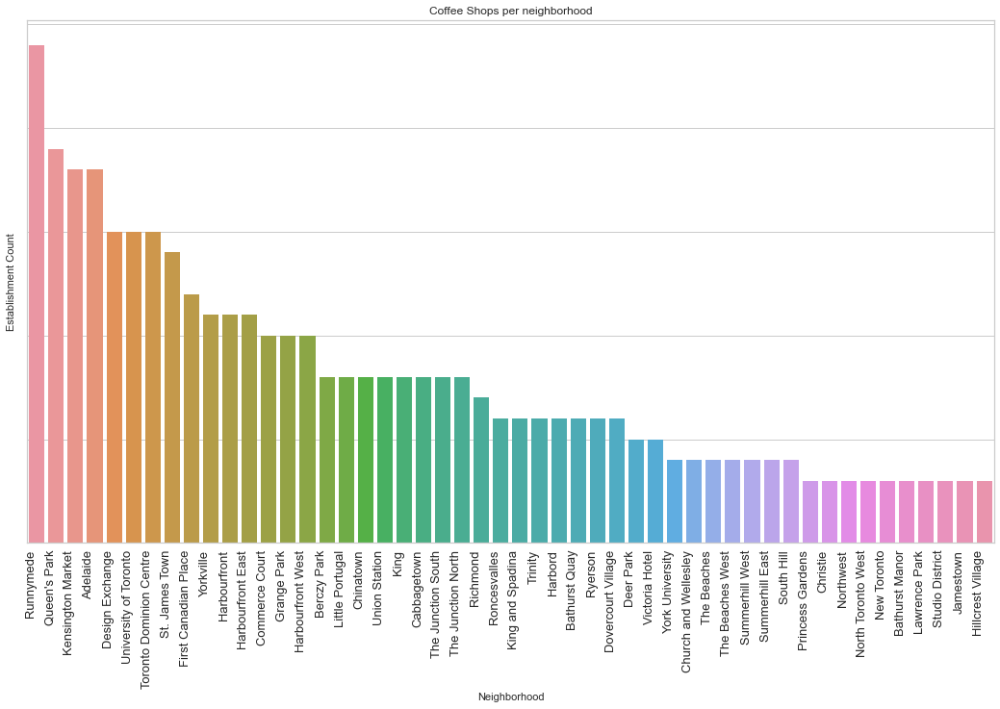

In [139]:
df_coffee = toronto_venues[toronto_venues['Venue Category'] == 'Coffee Shop'].groupby('Neighborhood').count().sort_values('Venue Category', ascending = False)
#df_cafe
df_coffee_bar = df_coffee.head(50)
plt.figure(figsize=(18,10))
by_coffee = sns.barplot(x=df_coffee_bar.index,y='Venue Category', data = df_coffee_bar)
by_coffee.set_xticklabels(by_cafe.get_xticklabels(), 
                          rotation=90, 
                          horizontalalignment='right',
                           fontsize = 13)
by_coffee.set(ylabel = "Establishment Count")
by_coffee.set_yticklabels(by_coffee.get_ymajorticklabels(), fontsize = 13)
by_coffee.set_title("Coffee Shops per neighborhood")

plt.show()

<ipython-input-140-9a9cfcb4c5db>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  by_tea.set_yticklabels(by_tea.get_ymajorticklabels(), fontsize = 13)


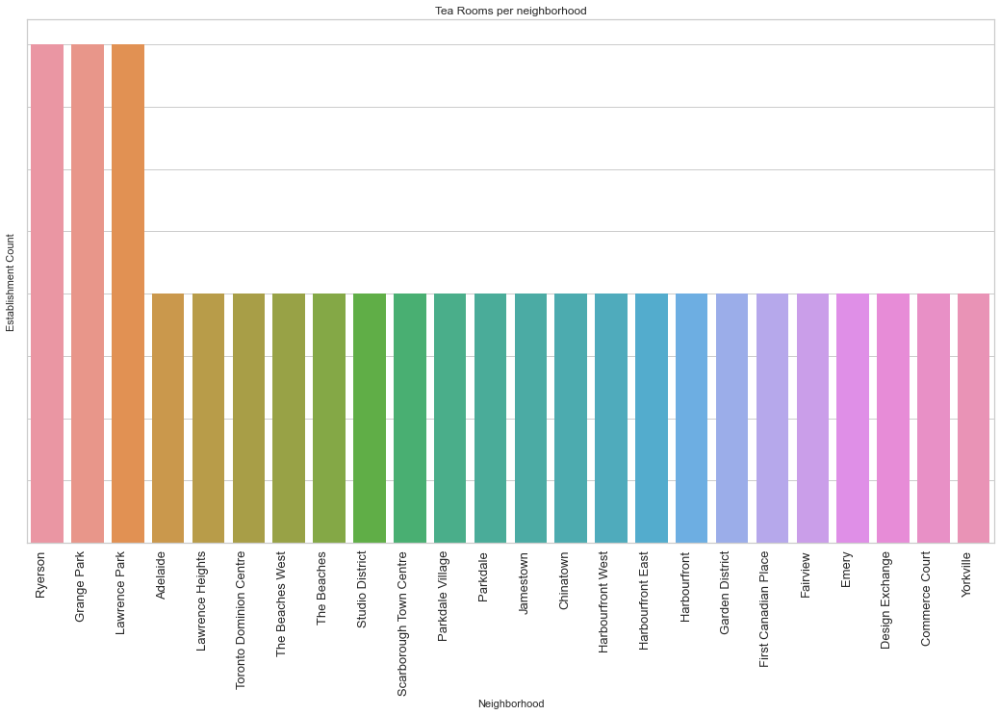

<Figure size 1440x864 with 0 Axes>

In [140]:
df_tea = toronto_venues[toronto_venues['Venue Category'] == 'Tea Room'].groupby('Neighborhood').count().sort_values('Venue Category', ascending = False)
#df_cafe
df_tea_bar = df_tea.head(50)
plt.figure(figsize=(18,10))
by_tea = sns.barplot(x=df_tea_bar.index,y='Venue Category', data = df_tea_bar)
by_tea.set_xticklabels(by_tea.get_xticklabels(), 
                          rotation=90, 
                          horizontalalignment='right',
                           fontsize = 13)
by_tea.set(ylabel = "Establishment Count")
by_tea.set_yticklabels(by_tea.get_ymajorticklabels(), fontsize = 13)
by_tea.set_title("Tea Rooms per neighborhood")
plt.figure(figsize=(20,12))
plt.show()

<ipython-input-141-33354785426d>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  by_bakery.set_yticklabels(by_bakery.get_ymajorticklabels(), fontsize = 13)


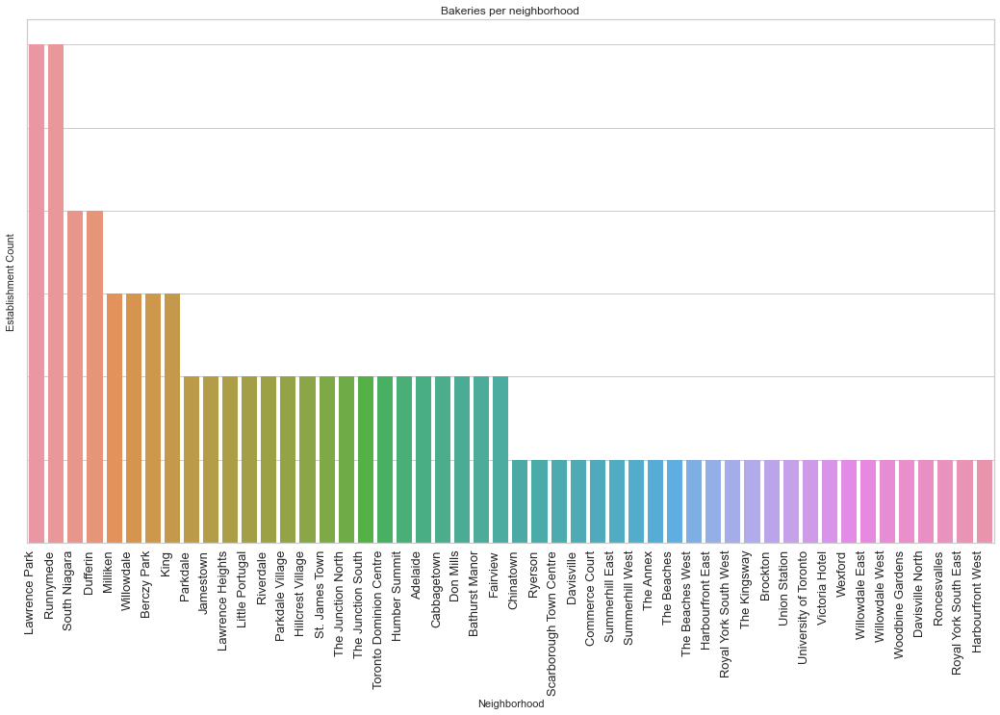

<Figure size 1440x864 with 0 Axes>

In [141]:
df_bakery = toronto_venues[toronto_venues['Venue Category'] == 'Bakery'].groupby('Neighborhood').count().sort_values('Venue Category', ascending = False)
#df_cafe
df_bakery_bar = df_bakery.head(50)
plt.figure(figsize=(18,10))
by_bakery = sns.barplot(x=df_bakery_bar.index,y='Venue Category', data = df_bakery_bar)
by_bakery.set_xticklabels(by_bakery.get_xticklabels(), 
                          rotation=90, 
                          horizontalalignment='right',
                           fontsize = 13)
by_bakery.set(ylabel = "Establishment Count")
by_bakery.set_yticklabels(by_bakery.get_ymajorticklabels(), fontsize = 13)
by_bakery.set_title("Bakeries per neighborhood")
plt.figure(figsize=(20,12))
plt.show()

<ipython-input-142-56191c5bd9ac>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  by_donut.set_yticklabels(by_donut.get_ymajorticklabels(), fontsize = 13)


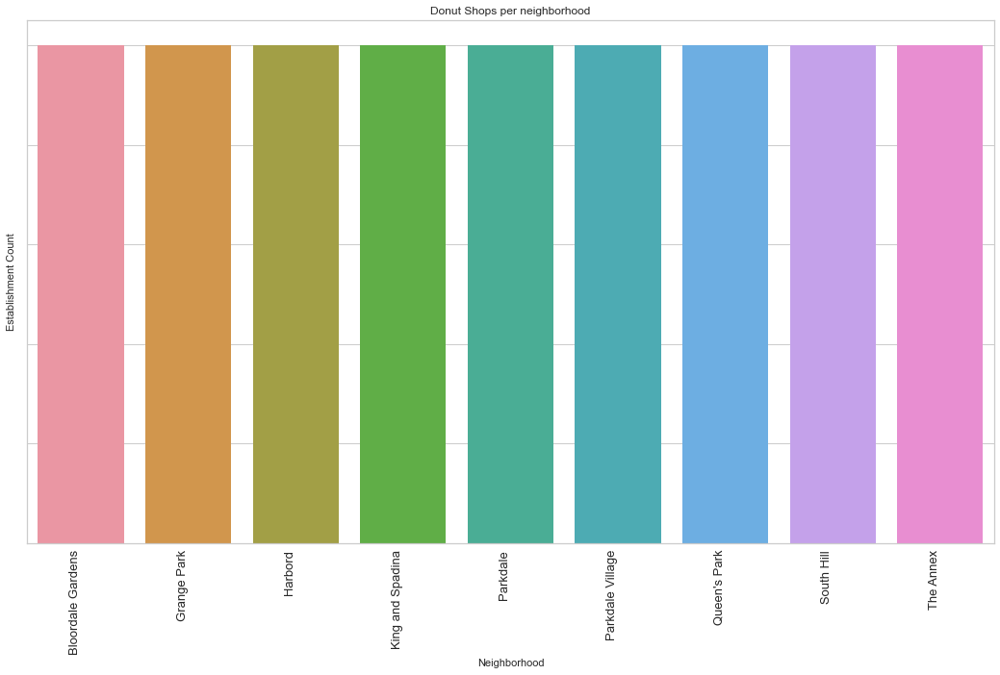

<Figure size 1440x864 with 0 Axes>

In [142]:
df_donut = toronto_venues[toronto_venues['Venue Category'] == 'Donut Shop'].groupby('Neighborhood').count().sort_values('Venue Category', ascending = False)
#df_cafe
df_donut_bar = df_donut.head(50)
plt.figure(figsize=(18,10))
by_donut = sns.barplot(x=df_donut_bar.index,y='Venue Category', data = df_donut_bar)
by_donut.set_xticklabels(by_donut.get_xticklabels(), 
                          rotation=90, 
                          horizontalalignment='right',
                           fontsize = 13)
by_donut.set(ylabel = "Establishment Count")
by_donut.set_yticklabels(by_donut.get_ymajorticklabels(), fontsize = 13)
by_donut.set_title("Donut Shops per neighborhood")
plt.figure(figsize=(20,12))
plt.show()

<ipython-input-143-01cdbf1c23e7>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  by_pastry.set_yticklabels(by_pastry.get_ymajorticklabels(), fontsize = 13)


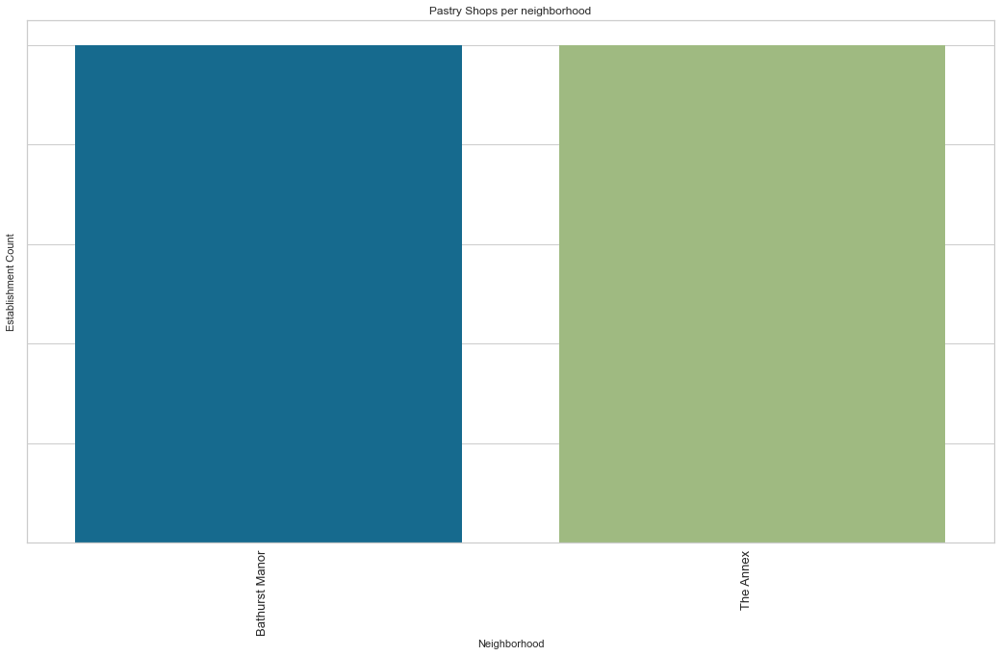

<Figure size 1440x864 with 0 Axes>

In [143]:
df_pastry = toronto_venues[toronto_venues['Venue Category'] == 'Pastry Shop'].groupby('Neighborhood').count().sort_values('Venue Category', ascending = False)
#df_cafe
df_pastry_bar = df_pastry.head(50)
plt.figure(figsize=(18,10))
by_pastry = sns.barplot(x=df_pastry_bar.index,y='Venue Category', data = df_pastry_bar)
by_pastry.set_xticklabels(by_pastry.get_xticklabels(), 
                          rotation=90, 
                          horizontalalignment='right',
                           fontsize = 13)
by_pastry.set(ylabel = "Establishment Count")
by_pastry.set_yticklabels(by_pastry.get_ymajorticklabels(), fontsize = 13)
by_pastry.set_title("Pastry Shops per neighborhood")
plt.figure(figsize=(20,12))
plt.show()

In [152]:
df_cluster_venues = toronto_venues[['Neighborhood','Venue','Venue Category']].join(toronto_merged_scores[['Neighbourhood','Cluster Labels']].set_index('Neighbourhood'), on='Neighborhood')
df_filtered_venues = df_cluster_venues[(df_cluster_venues['Venue Category'] == 'Café') | (df_cluster_venues['Venue Category'] == 'Coffee Shop') | (df_cluster_venues['Venue Category'] == 'Bakery') | (df_cluster_venues['Venue Category'] == 'Donut Shop') | (df_cluster_venues['Venue Category'] == 'Pastry Shop') | (df_cluster_venues['Venue Category'] == 'Tea Room')]
df_filtered_venues

,Neighborhood,Venue,Venue Category,Cluster Labels
1,Parkwoods,Tim Hortons,Café,0
8,Parkwoods,La Notre,Coffee Shop,0
17,Regent Park,Sumach Espresso,Coffee Shop,3
33,Regent Park,Savoury Grounds,Coffee Shop,3
34,Regent Park,Tim Hortons,Coffee Shop,3
53,Harbourfront,Mos Mos,Coffee Shop,3
54,Harbourfront,Boxcar Social,Café,3
65,Harbourfront,Aroma Espresso Bar,Café,3
75,Harbourfront,Lavazza Espression,Coffee Shop,3
83,Harbourfront,World Café at Harbourfront Centre,Café,3


In [154]:
df_cluster_summary = df_filtered_venues.groupby(['Cluster Labels','Venue Category']).nunique()
df_cluster_summary

Neighborhood  Venue
Cluster Labels Venue Category                     
0              Bakery                    45     45
               Café                      54     82
               Coffee Shop               74     60
               Donut Shop                 5      4
               Pastry Shop                1      1
               Tea Room                  13      9
1              Bakery                     7      7
               Café                       4      3
               Coffee Shop                9      3
               Donut Shop                 3      2
               Pastry Shop                1      1
               Tea Room                   4      2
2              Bakery                     8      7
               Coffee Shop                1      1
3              Bakery                    11      5
               Café                      15     29
               Coffee Shop               36     25
               Donut Shop                 1      1
               Tea Room                   7      3
4              Bakery                     1      1
               Café                       4     11
               Coffee Shop                1      1

In [160]:
df_c4 = toronto_merged_scores[toronto_merged_scores['Cluster Labels'] == 3]
df_c4[['Neighbourhood','Cluster Labels','Bakery', 'Café', 'Coffee Shop','Donut Shop','Pastry Shop', 'Tea Room']]

,Neighbourhood,Cluster Labels,Bakery,Café,Coffee Shop,Donut Shop,Pastry Shop,Tea Room
2,Regent Park,3,0.000000,0.000000,0.136364,0.000000,0.0,0.000000
3,Harbourfront,3,0.010000,0.050000,0.150000,0.000000,0.0,0.010000
6,Queen's Park,3,0.000000,0.092105,0.250000,0.013158,0.0,0.000000
31,Morningside,3,0.000000,0.083333,0.166667,0.000000,0.0,0.000000
37,Central Bay Street,3,0.000000,0.013699,0.136986,0.000000,0.0,0.000000
50,Scarborough Village,3,0.000000,0.000000,0.222222,0.000000,0.0,0.000000
51,Fairview,3,0.020408,0.020408,0.183673,0.000000,0.0,0.010204
53,Oriole,3,0.000000,0.000000,0.428571,0.000000,0.0,0.000000
55,York University,3,0.000000,0.142857,0.190476,0.000000,0.0,0.000000
56,East Toronto,3,0.000000,0.000000,0.250000,0.000000,0.0,0.000000


## Recommendation

We are looking to enter areas packed with Coffee Shops, Cafés, or Tea Rooms, as they complement our products, where competition is minimal, as our brand is a new entrant in the market. Given this backdrop, Cluster 3 is of interest.

Within Cluster 3, we would like to prioritize neighborhoods that are densely populated with coffee shops and pose little competition. The neighborhoods are: Oriole, Queen's Park, East Toronto, Mount Dennis, North Park, St Phillips, Martin Grove Gardens, Scarborough Village, Scarborough Village West, The Queensway East, Jamestown.

We note that Runnymede (Cluster 0) has a high presence of Cafés, Coffee Shops, but also Bakeries. While this neighborhood is of a lesser priority as of this analysis, one would be prudent to familiarize one’s self with the scene at this neighborhood for two reasons. 

First, competition may come from establishments here seeking to expand elsewhere. As such, we should take steps to prevent or challenge such moves, should they choose to expand to our locations of interest.

Second, it would be prudent to earmark this location for further expansion later when the brand is more established and able to operate in a more competitive environment.
Moreover, as there is a notably low volume of donut shops and pastry shops, additional confirmation is required, for example via a visual inspection of the recommended neighborhoods, to validate the situation as the data suggests. 

For further analysis, as the accuracy of the models has room for improvement, consider augmenting the study with more data from other sources, such as store ratings, a richer list of establishments and locations, foot traffic or population density.